# Thrivelines from a saved correlation matrix

Thrivelines show how a z-score is expected to evolve over one covariate step
(by default, one year). To estimate them we need to know the correlation matrix (= how strongly z-scores correlate across ages).

In pcntoolkit the correlation matrix lives in the `CorrelationMatrix` class, and everything downstream, scoring subjects and drawing
thrivelines, needs only that matrix plus a fitted normative model.

In this notebook we plot thrivelines using a precomputed correlation matrix. The matrix already carries everything learned from a longitudinal cohort, so no longitudinal data is needed to plot them.

> **Note:** the normative model is downloaded automatically from SURFdrive, but the correlation matrix exists in a private directory.

In [1]:
import matplotlib.pyplot as plt
import numpy as np


from pcntoolkit import CorrelationMatrix, NormativeModel, ZGainScore
from pcntoolkit.util.plotter import plot_thrivelines

In [2]:
from scipy import stats


In [3]:
import warnings
from pandas.errors import PerformanceWarning
MODEL_PATH= '/project_cephfs/3022017.06/projects/lifespan_hbr/johbay/Velocity/CODE_new/revision/save_dir_SC_ADNI_demented_revision/'

model = NormativeModel.load(str(MODEL_PATH))
print("covariates:   ", model.covariates)
print("response vars:", list(model.response_vars))

/home/preclineu/johbay/.conda/envs/pcntoolkit_velocity/lib/python3.12/site-packages/pcntoolkit/util/output.py:309: UserWarning: Process: 4088496 - 2026-09-14 21:39:35 - This model was saved with PCNtoolkit v1.1.2, but you are running v1.3.0. Loading this model in v1.3.0...
  warnings.warn(message, category)
/home/preclineu/johbay/.conda/envs/pcntoolkit_velocity/lib/python3.12/site-packages/pcntoolkit/util/output.py:309: UserWarning: Process: 4088496 - 2026-09-14 21:39:37 - This model was saved with PCNtoolkit v1.1.2, but you are running v1.3.0. Loading this model in v1.3.0...
  warnings.warn(message, category)
/home/preclineu/johbay/.conda/envs/pcntoolkit_velocity/lib/python3.12/site-packages/pcntoolkit/util/output.py:309: UserWarning: Process: 4088496 - 2026-09-14 21:39:38 - This model was saved with PCNtoolkit v1.1.2, but you are running v1.3.0. Loading this model in v1.3.0...
  warnings.warn(message, category)
/home/preclineu/johbay/.conda/envs/pcntoolkit_velocity/lib/python3.12/sit

covariates:    ['age']
response vars: ['Brain-Stem', 'CC_Anterior', 'EstimatedTotalIntraCranialVol', 'SupraTentorialVol', 'Left-Lateral-Ventricle', 'Right-Hippocampus', 'Left-VentralDC', 'Left-Putamen', 'Right-VentralDC', 'Right-choroid-plexus', 'SupraTentorialVolNotVent', 'SubCortGrayVol', 'Right-Thalamus', 'Right-Putamen', 'rhCortexVol', 'CSF', 'Right-Accumbens-area', 'Left-Accumbens-area', 'BrainSegVol', 'CC_Mid_Posterior', 'Left-choroid-plexus', 'non-WM-hypointensities', 'Right-Lateral-Ventricle', 'Right-Inf-Lat-Vent', 'Left-Pallidum', 'Right-Caudate', 'Right-Cerebellum-White-Matter', 'CC_Central', 'Right-Pallidum', 'Left-Caudate', 'Left-Thalamus', 'lhCortexVol', 'Left-Hippocampus', 'CC_Posterior', 'WM-hypointensities', 'Left-Cerebellum-White-Matter', 'CC_Mid_Anterior', 'Right-Amygdala', 'Right-vessel', 'BrainSegVol-to-eTIV', 'Right-Cerebellum-Cortex', 'Left-Amygdala', 'Left-Cerebellum-Cortex', 'Left-vessel', 'Left-Inf-Lat-Vent', '3rd-Ventricle', 'TotalGrayVol']


/home/preclineu/johbay/.conda/envs/pcntoolkit_velocity/lib/python3.12/site-packages/pcntoolkit/util/output.py:309: UserWarning: Process: 4088496 - 2026-09-14 21:40:04 - This model was saved with PCNtoolkit v1.1.2, but you are running v1.3.0. Loading this model in v1.3.0...
  warnings.warn(message, category)


In [4]:
features_to_model = ['Left-Lateral-Ventricle',
 'Left-Inf-Lat-Vent',
 'Left-Cerebellum-White-Matter',
 'Left-Cerebellum-Cortex',
 'Left-Thalamus',
 'Left-Caudate',
 'Left-Putamen',
 'Left-Pallidum',
 '3rd-Ventricle',
 '4th-Ventricle',#
 'Brain-Stem', #
 'Left-Hippocampus',
 'Left-Amygdala',
 'CSF',
 'Left-Accumbens-area',
 'Left-VentralDC',
 'Left-vessel',
 'Left-choroid-plexus',
 'Right-Lateral-Ventricle',
 'Right-Inf-Lat-Vent',
 'Right-Cerebellum-White-Matter',
 'Right-Cerebellum-Cortex',
 'Right-Thalamus',
 'Right-Caudate',
 'Right-Putamen',
 'Right-Pallidum',
 'Right-Hippocampus',
 'Right-Amygdala',
 'Right-Accumbens-area',
 'Right-VentralDC',
 'Right-vessel',
 'Right-choroid-plexus',#
 '5th-Ventricle',
 'WM-hypointensities',
 'Left-WM-hypointensities',
 'Right-WM-hypointensities',
 'non-WM-hypointensities',
 'Left-non-WM-hypointensities',
 'Right-non-WM-hypointensities',
 'Optic-Chiasm',
 'CC_Posterior',
 'CC_Mid_Posterior',
 'CC_Central',
 'CC_Mid_Anterior',
 'CC_Anterior',
 'BrainSegVol',
 'BrainSegVolNotVent',
 'lhCortexVol',
 'rhCortexVol',
 'CortexVol',
 'lhCerebralWhiteMatterVol',
 'rhCerebralWhiteMatterVol',
 'CerebralWhiteMatterVol',
 'SubCortGrayVol',
 'TotalGrayVol',
 'SupraTentorialVol',
 'SupraTentorialVolNotVent',
 'MaskVol',
 'BrainSegVol-to-eTIV',
 'MaskVol-to-eTIV',
 'lhSurfaceHoles',
 'rhSurfaceHoles',
 'SurfaceHoles',
 'EstimatedTotalIntraCranialVol']

In [4]:
features_to_model = ['Left-Lateral-Ventricle',
 'Left-Inf-Lat-Vent',
 '3rd-Ventricle',
 '4th-Ventricle',#
 'CSF',
 'Left-vessel',
 'Right-Lateral-Ventricle',
 'Right-Inf-Lat-Vent',
 'Right-vessel',
 '5th-Ventricle',
 'WM-hypointensities',
 'Left-WM-hypointensities',
 'Right-WM-hypointensities',
 'non-WM-hypointensities',
 'Left-non-WM-hypointensities',
 'Right-non-WM-hypointensities',
 ]

## 1. Load precomputed correlation matrix

`load()` loads only one specific file layout: the velocity models from Johanna
Bayer's pipeline, saved in `batch_<n>_<region>/Velocity/<file>.pkl`. The region name is not stored inside the file, so it is read from the directory name.

Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:40:48 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:40:48 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:40:48 - Computing centiles for Left-Lateral-Ventricle.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


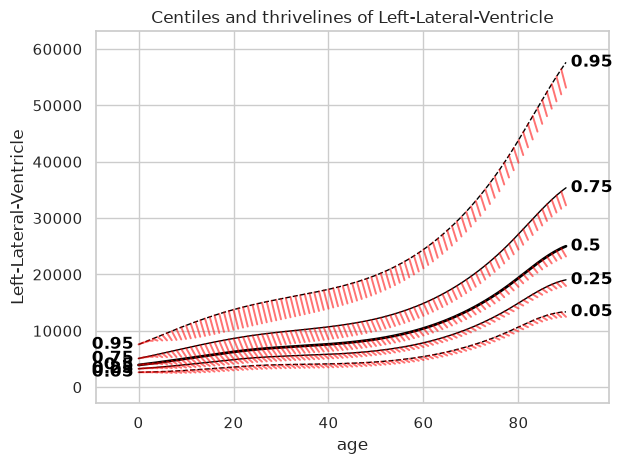

[ok]   i=0  Left-Lateral-Ventricle


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:41:30 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:41:30 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:41:30 - Computing centiles for Left-Inf-Lat-Vent.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


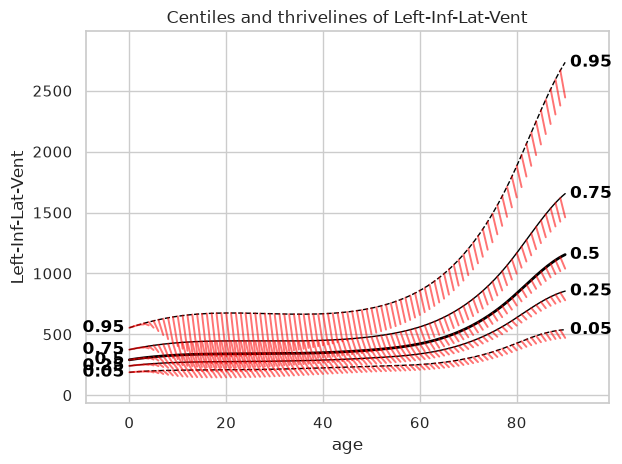

[ok]   i=1  Left-Inf-Lat-Vent


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:42:06 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:42:06 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:42:06 - Computing centiles for Left-Cerebellum-White-Matter.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


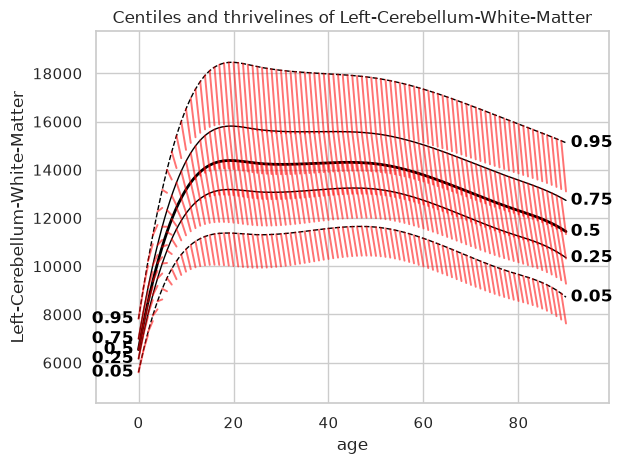

[ok]   i=2  Left-Cerebellum-White-Matter


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:42:42 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:42:42 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:42:42 - Computing centiles for Left-Cerebellum-Cortex.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


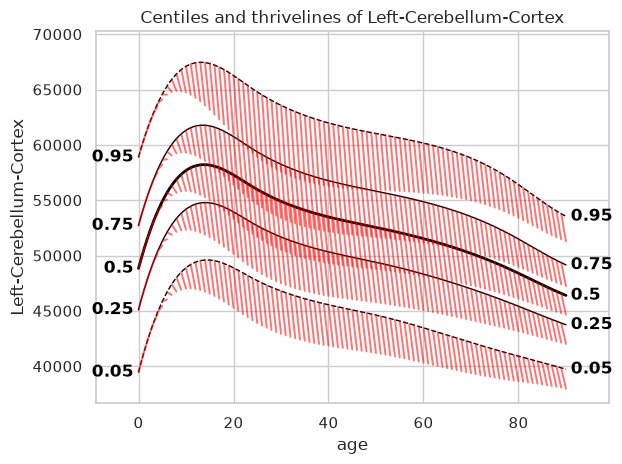

[ok]   i=3  Left-Cerebellum-Cortex


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:43:20 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:43:20 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:43:20 - Computing centiles for Left-Thalamus.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


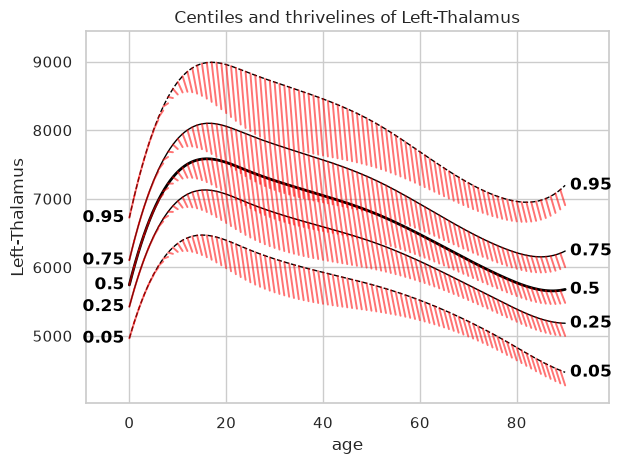

[ok]   i=4  Left-Thalamus


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:43:59 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:43:59 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:43:59 - Computing centiles for Left-Caudate.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


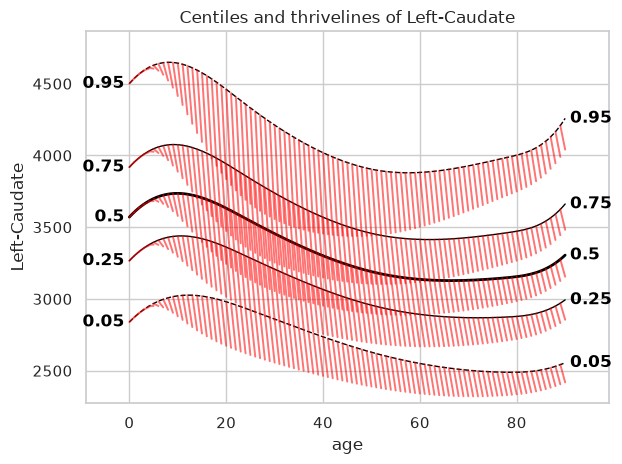

[ok]   i=5  Left-Caudate


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:44:39 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:44:39 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:44:39 - Computing centiles for Left-Putamen.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


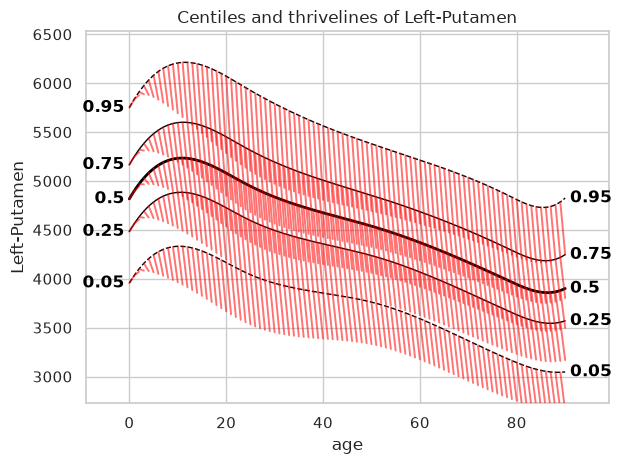

[ok]   i=6  Left-Putamen


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:45:22 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:45:22 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:45:22 - Computing centiles for Left-Pallidum.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


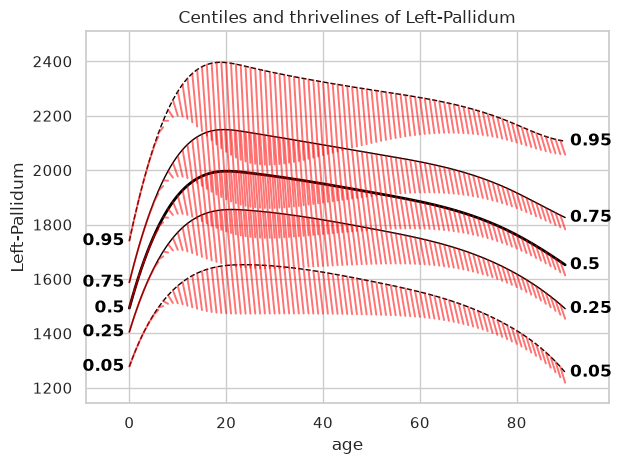

[ok]   i=7  Left-Pallidum


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:46:02 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:46:02 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:46:02 - Computing centiles for 3rd-Ventricle.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


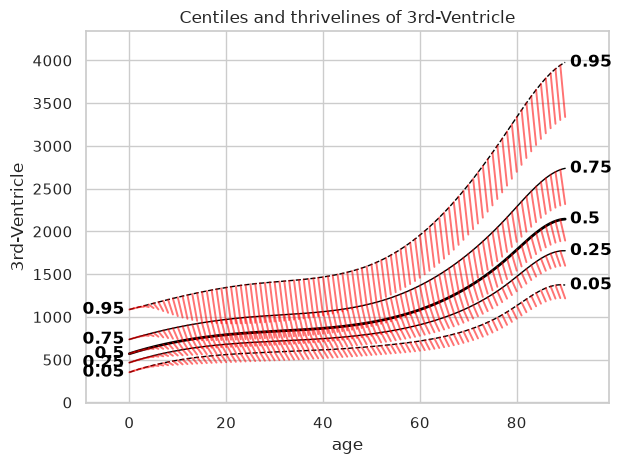

[ok]   i=8  3rd-Ventricle
[FAIL] i=9  4th-Ventricle: Process: 4088496 - 2026-09-14 21:46:21 - HBR model is not fitted


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:46:40 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:46:40 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:46:40 - Computing centiles for Brain-Stem.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


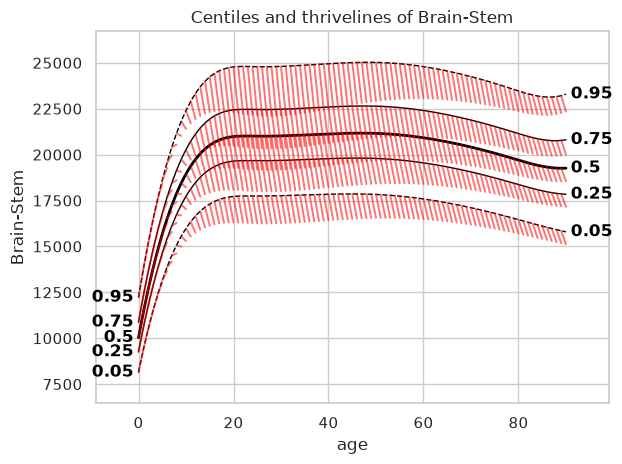

[ok]   i=10  Brain-Stem


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:47:23 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:47:23 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:47:23 - Computing centiles for Left-Hippocampus.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


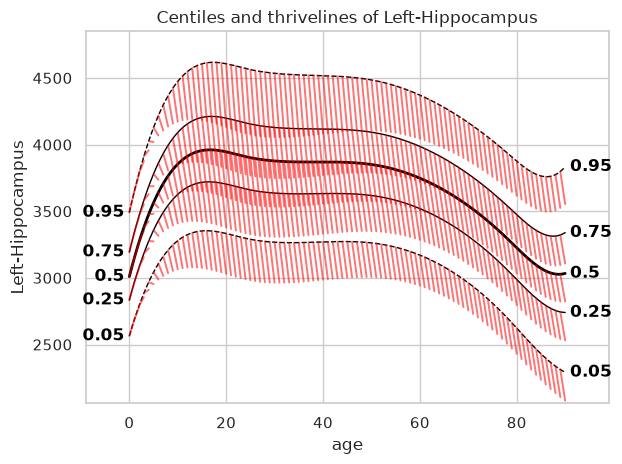

[ok]   i=11  Left-Hippocampus


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:48:08 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:48:08 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:48:08 - Computing centiles for Left-Amygdala.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


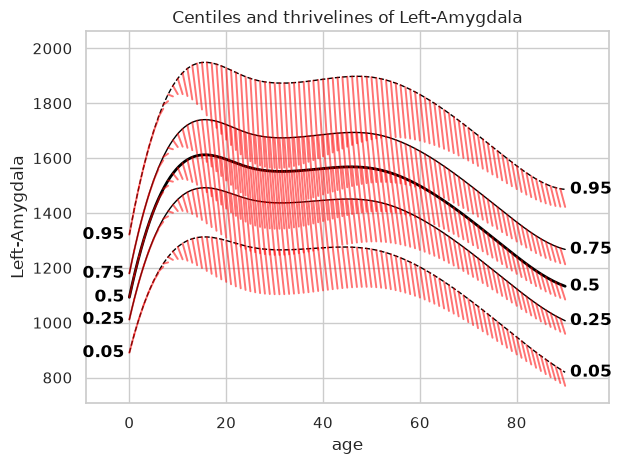

[ok]   i=12  Left-Amygdala


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:48:44 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:48:44 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:48:44 - Computing centiles for CSF.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


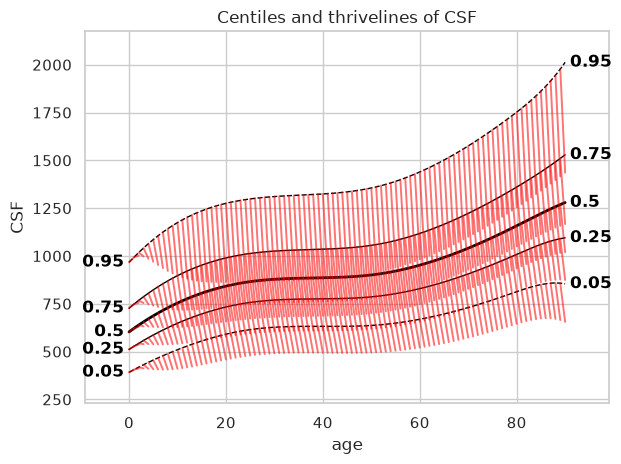

[ok]   i=13  CSF


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:49:21 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:49:21 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:49:21 - Computing centiles for Left-Accumbens-area.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


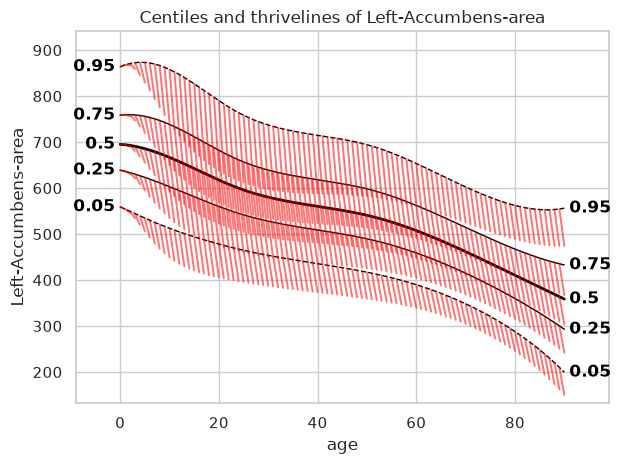

[ok]   i=14  Left-Accumbens-area


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:49:57 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:49:57 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:49:57 - Computing centiles for Left-VentralDC.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


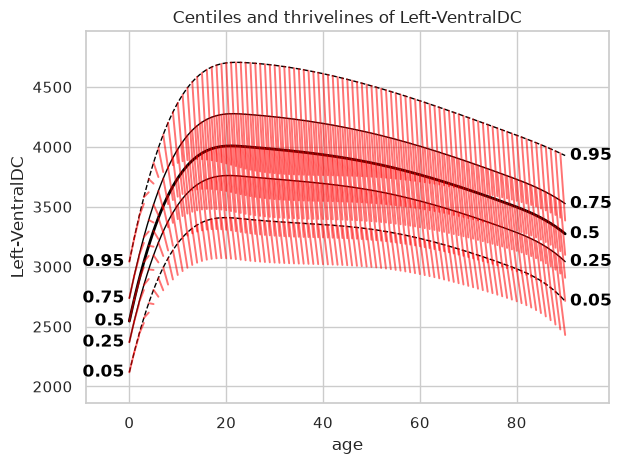

[ok]   i=15  Left-VentralDC


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:50:34 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:50:34 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:50:34 - Computing centiles for Left-vessel.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


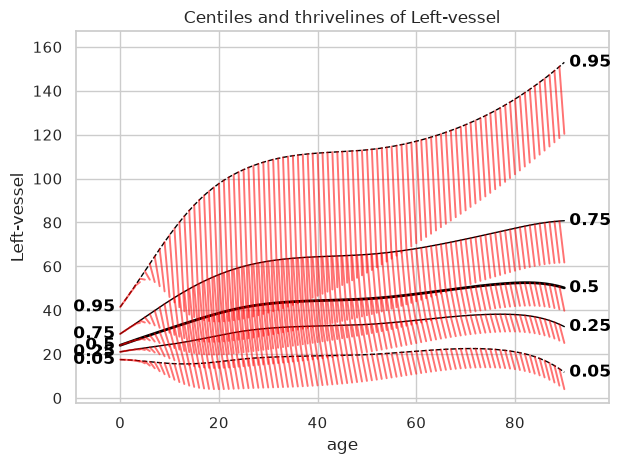

[ok]   i=16  Left-vessel


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:51:12 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:51:12 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:51:12 - Computing centiles for Left-choroid-plexus.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


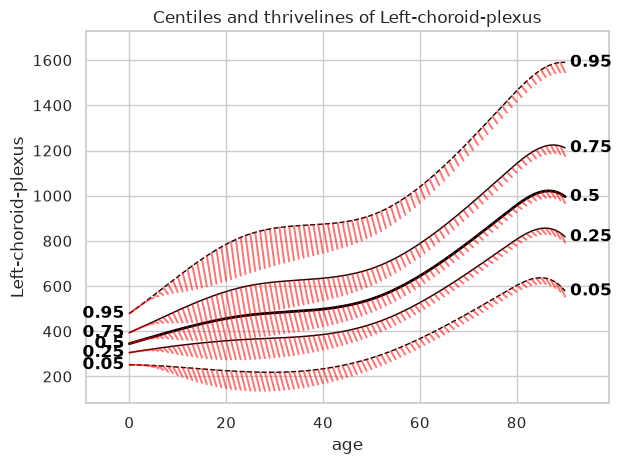

[ok]   i=17  Left-choroid-plexus


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:51:50 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:51:50 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:51:50 - Computing centiles for Right-Lateral-Ventricle.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


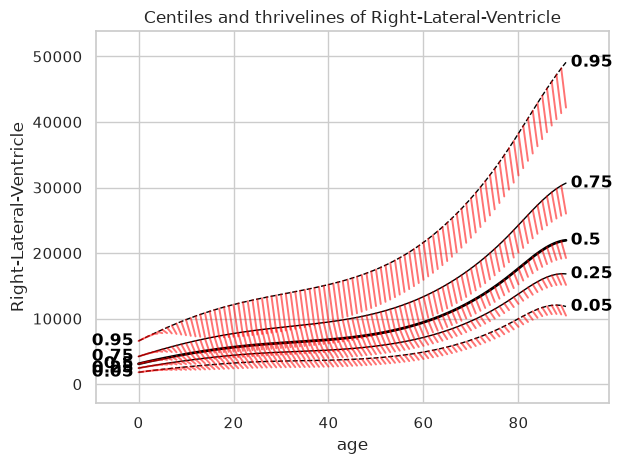

[ok]   i=18  Right-Lateral-Ventricle


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:52:28 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:52:28 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:52:28 - Computing centiles for Right-Inf-Lat-Vent.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


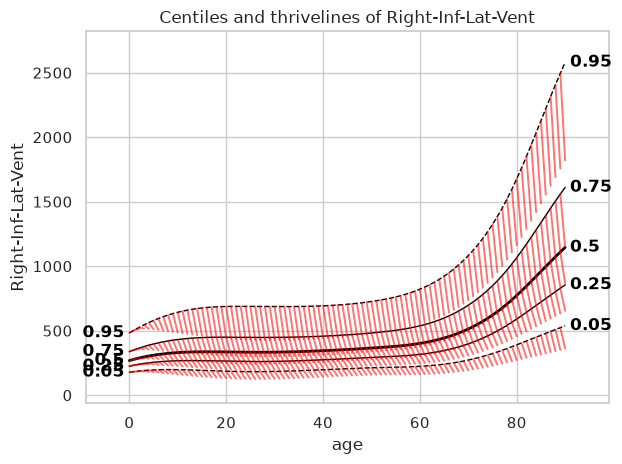

[ok]   i=19  Right-Inf-Lat-Vent


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:53:06 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:53:06 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:53:06 - Computing centiles for Right-Cerebellum-White-Matter.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


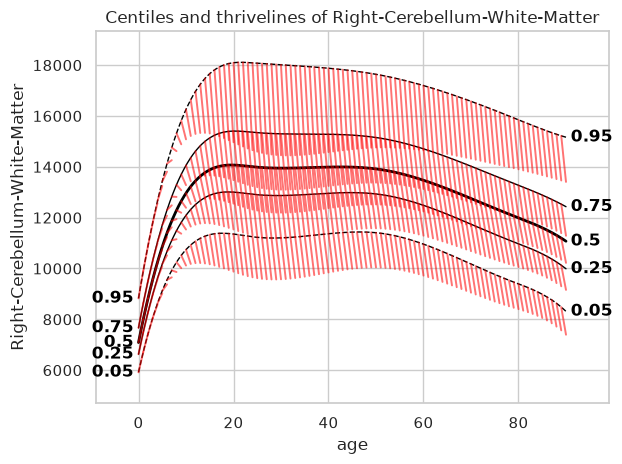

[ok]   i=20  Right-Cerebellum-White-Matter


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:53:44 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:53:44 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:53:44 - Computing centiles for Right-Cerebellum-Cortex.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


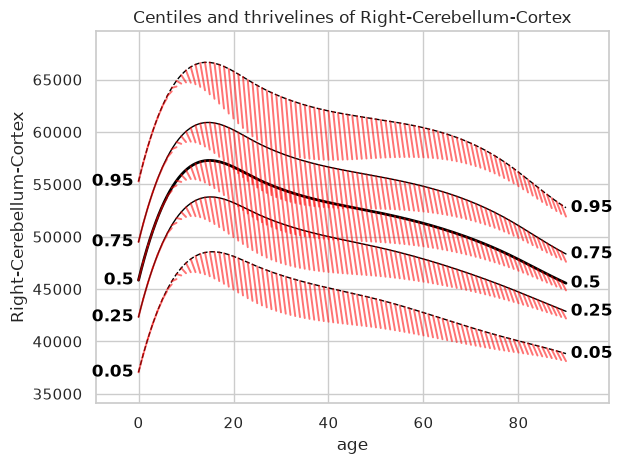

[ok]   i=21  Right-Cerebellum-Cortex


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:54:29 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:54:29 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:54:29 - Computing centiles for Right-Thalamus.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


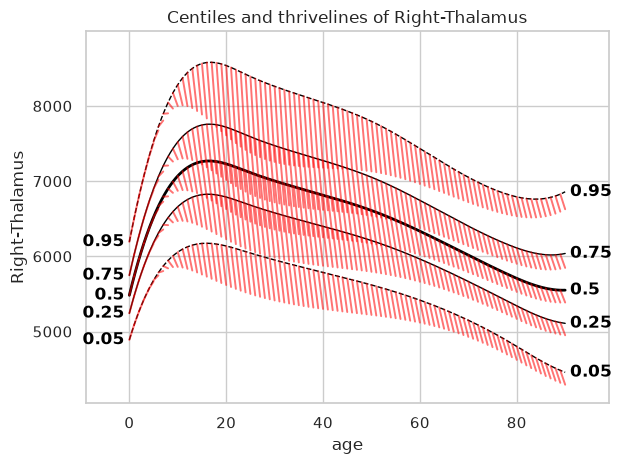

[ok]   i=22  Right-Thalamus


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:55:11 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:55:11 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:55:11 - Computing centiles for Right-Caudate.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


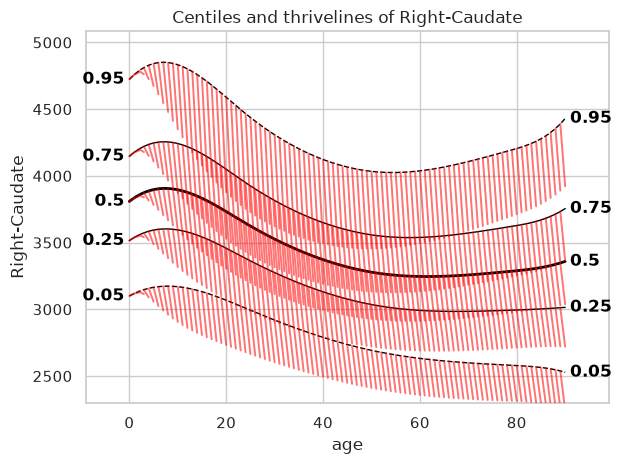

[ok]   i=23  Right-Caudate


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:55:52 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:55:52 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:55:52 - Computing centiles for Right-Putamen.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


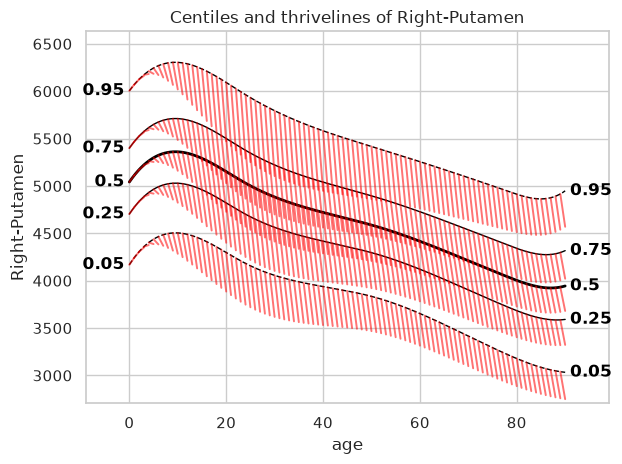

[ok]   i=24  Right-Putamen


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:56:34 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:56:34 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:56:34 - Computing centiles for Right-Pallidum.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


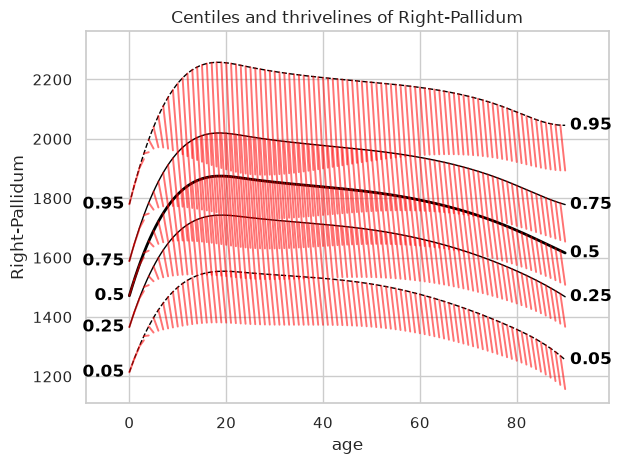

[ok]   i=25  Right-Pallidum


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:57:14 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:57:14 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:57:14 - Computing centiles for Right-Hippocampus.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


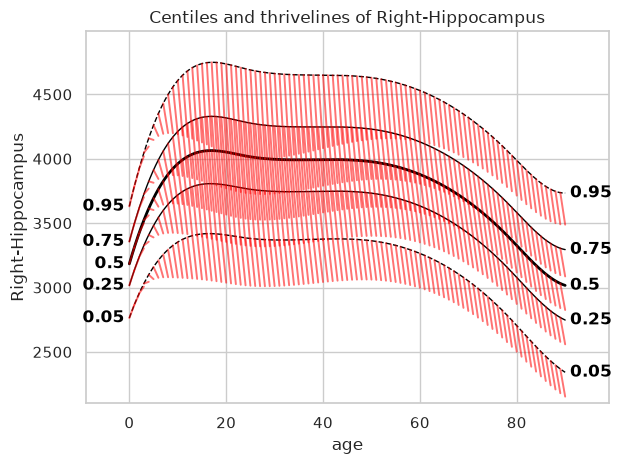

[ok]   i=26  Right-Hippocampus


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:57:56 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:57:56 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:57:56 - Computing centiles for Right-Amygdala.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


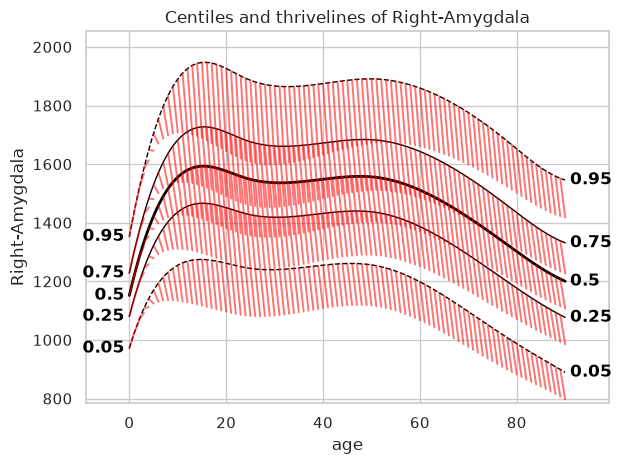

[ok]   i=27  Right-Amygdala


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:58:38 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:58:38 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:58:38 - Computing centiles for Right-Accumbens-area.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


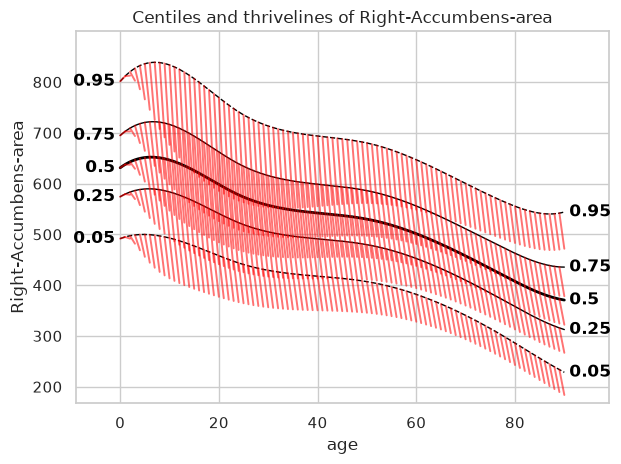

[ok]   i=28  Right-Accumbens-area


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 21:59:20 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 21:59:20 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 21:59:20 - Computing centiles for Right-VentralDC.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


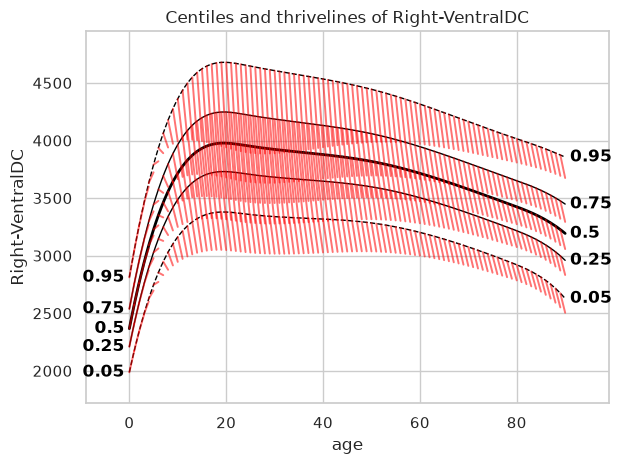

[ok]   i=29  Right-VentralDC


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 22:00:04 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 22:00:04 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 22:00:04 - Computing centiles for Right-vessel.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


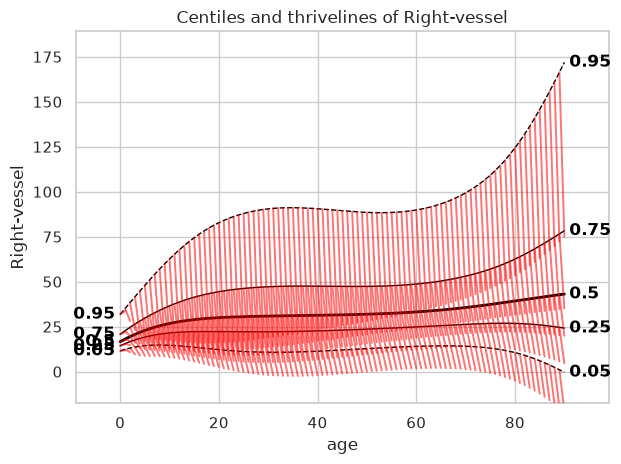

[ok]   i=30  Right-vessel


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 22:00:46 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 22:00:46 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 22:00:46 - Computing centiles for Right-choroid-plexus.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


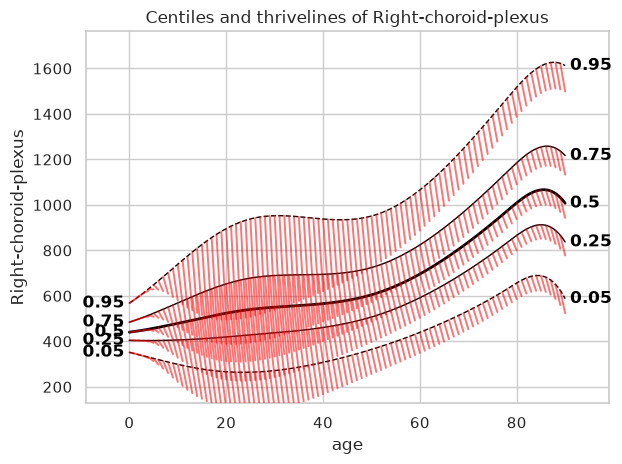

[ok]   i=31  Right-choroid-plexus
[FAIL] i=32  5th-Ventricle: Process: 4088496 - 2026-09-14 22:01:08 - HBR model is not fitted


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 22:01:29 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 22:01:29 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 22:01:29 - Computing centiles for WM-hypointensities.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


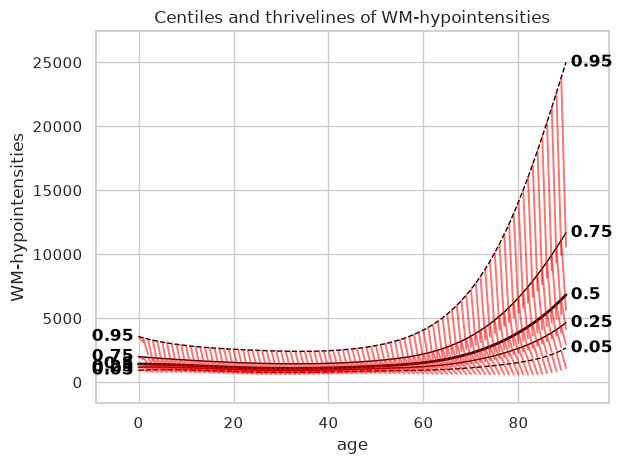

[ok]   i=33  WM-hypointensities
[MISSING] i=34  Left-WM-hypointensities: no matching batch folder
[MISSING] i=35  Right-WM-hypointensities: no matching batch folder


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 22:02:12 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 22:02:12 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 22:02:12 - Computing centiles for non-WM-hypointensities.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


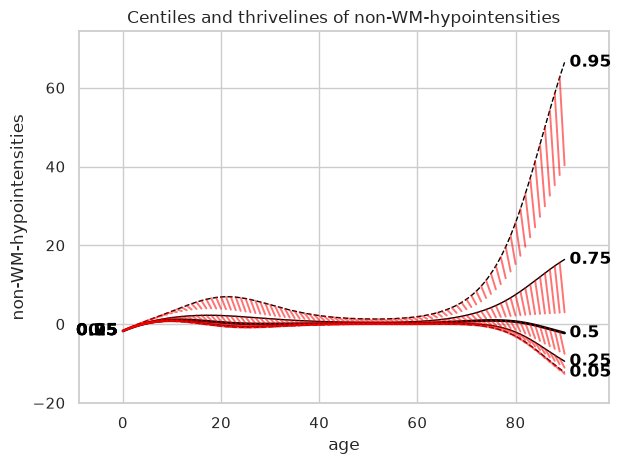

[ok]   i=36  non-WM-hypointensities
[MISSING] i=37  Left-non-WM-hypointensities: no matching batch folder
[MISSING] i=38  Right-non-WM-hypointensities: no matching batch folder
[FAIL] i=39  Optic-Chiasm: Process: 4088496 - 2026-09-14 22:02:33 - HBR model is not fitted


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 22:02:52 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 22:02:52 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 22:02:52 - Computing centiles for CC_Posterior.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


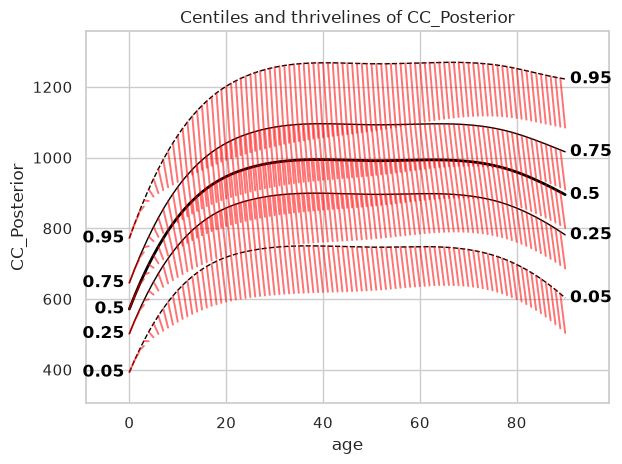

[ok]   i=40  CC_Posterior


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 22:03:31 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 22:03:31 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 22:03:31 - Computing centiles for CC_Mid_Posterior.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


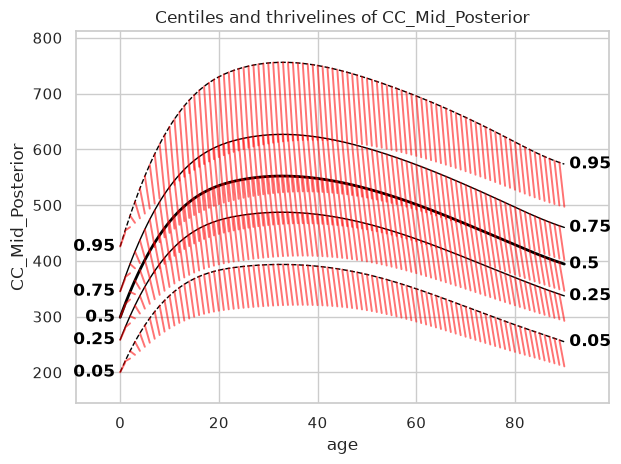

[ok]   i=41  CC_Mid_Posterior


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 22:04:09 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 22:04:09 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 22:04:09 - Computing centiles for CC_Central.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


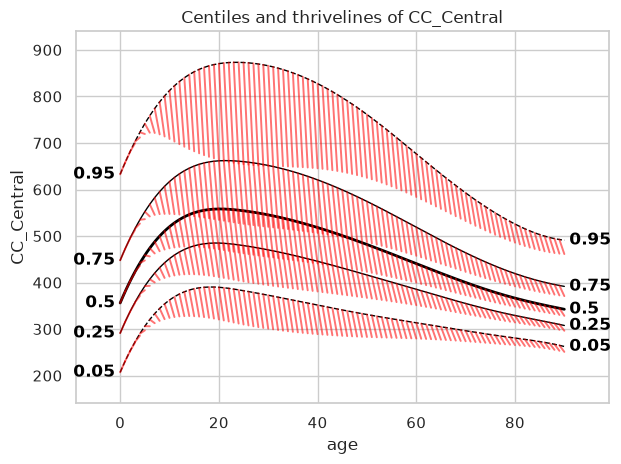

[ok]   i=42  CC_Central


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 22:04:45 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 22:04:45 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 22:04:45 - Computing centiles for CC_Mid_Anterior.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


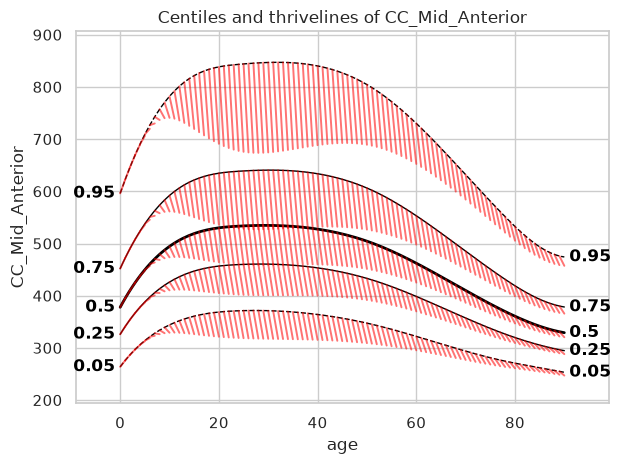

[ok]   i=43  CC_Mid_Anterior


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 22:05:24 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 22:05:24 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 22:05:24 - Computing centiles for CC_Anterior.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


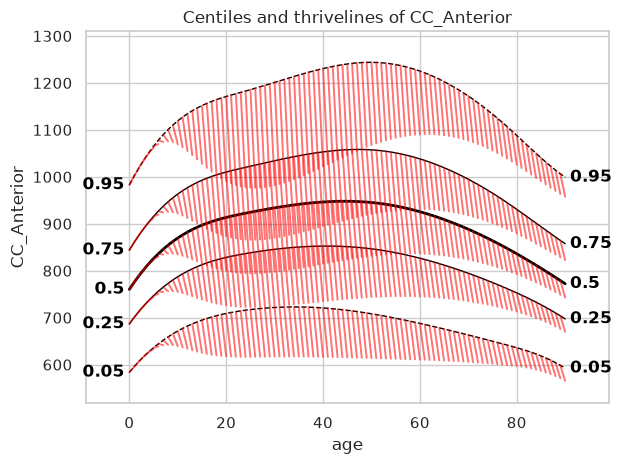

[ok]   i=44  CC_Anterior


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 22:06:02 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 22:06:02 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 22:06:02 - Computing centiles for BrainSegVol.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


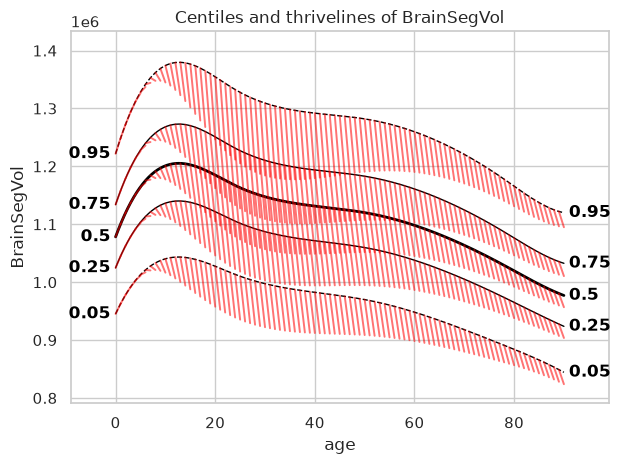

[ok]   i=45  BrainSegVol
[MISSING] i=46  BrainSegVolNotVent: no matching batch folder


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 22:06:39 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 22:06:39 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 22:06:39 - Computing centiles for lhCortexVol.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


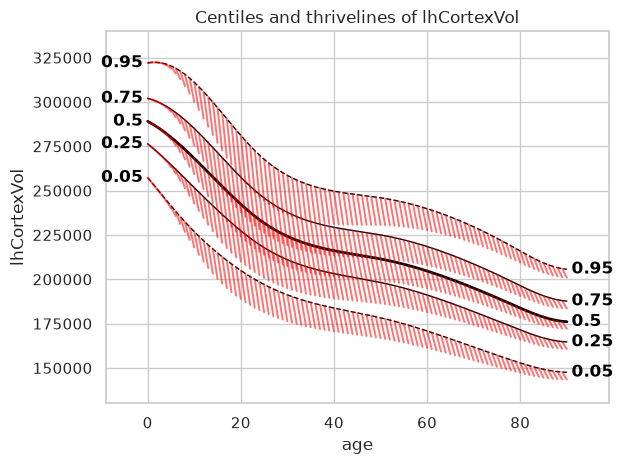

[ok]   i=47  lhCortexVol


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 22:07:15 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 22:07:15 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 22:07:15 - Computing centiles for rhCortexVol.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


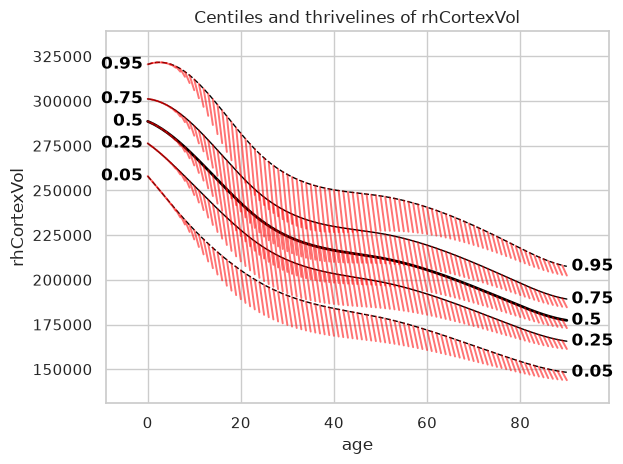

[ok]   i=48  rhCortexVol
[MISSING] i=49  CortexVol: no matching batch folder
[MISSING] i=50  lhCerebralWhiteMatterVol: no matching batch folder
[MISSING] i=51  rhCerebralWhiteMatterVol: no matching batch folder
[MISSING] i=52  CerebralWhiteMatterVol: no matching batch folder


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 22:07:54 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 22:07:54 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 22:07:54 - Computing centiles for SubCortGrayVol.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


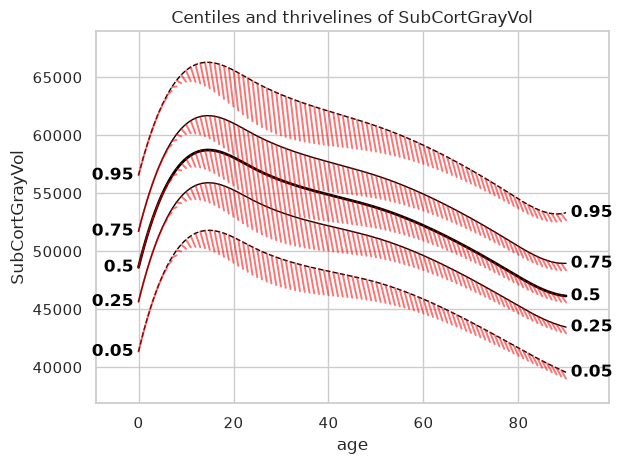

[ok]   i=53  SubCortGrayVol


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 22:08:31 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 22:08:31 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 22:08:31 - Computing centiles for TotalGrayVol.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


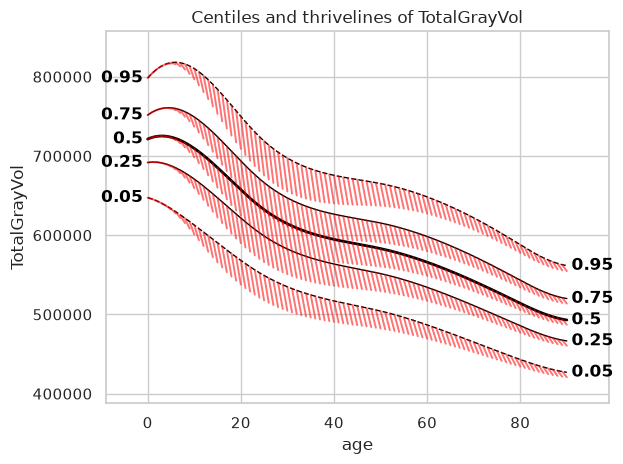

[ok]   i=54  TotalGrayVol


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 22:09:08 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 22:09:08 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 22:09:08 - Computing centiles for SupraTentorialVol.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


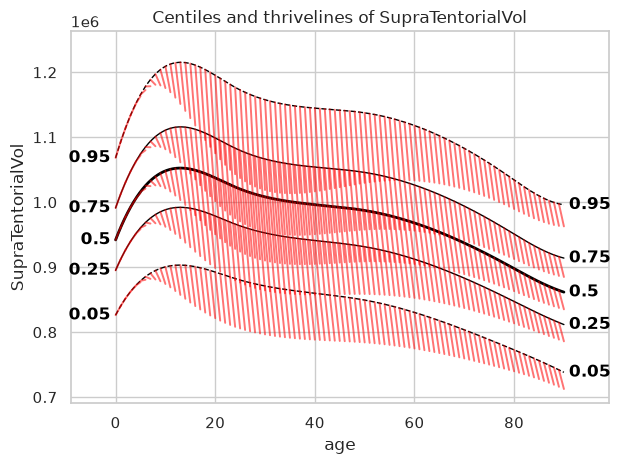

[ok]   i=55  SupraTentorialVol


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 22:09:47 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 22:09:47 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 22:09:47 - Computing centiles for SupraTentorialVolNotVent.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


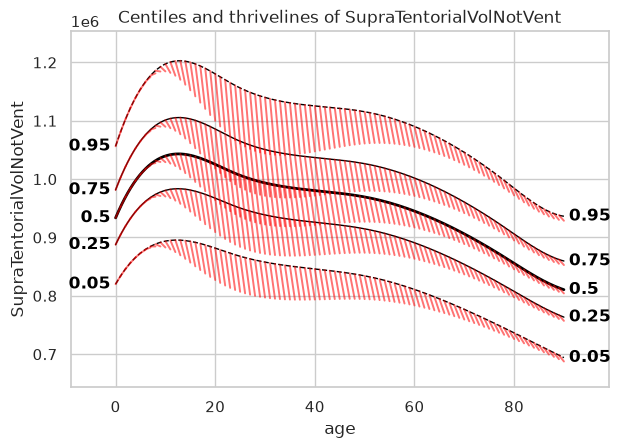

[ok]   i=56  SupraTentorialVolNotVent
[MISSING] i=57  MaskVol: no matching batch folder


Sampling: []
Sampling: []


Process: 4088496 - 2026-09-14 22:10:27 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 4088496 - 2026-09-14 22:10:27 - Computing centiles for 1 response variables.
Process: 4088496 - 2026-09-14 22:10:27 - Computing centiles for BrainSegVol-to-eTIV.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


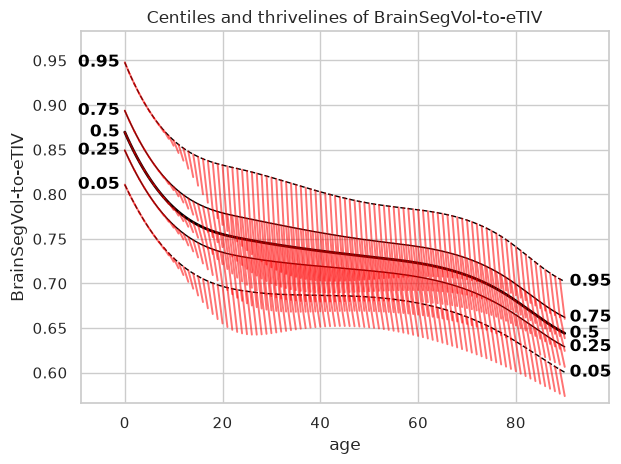

[ok]   i=58  BrainSegVol-to-eTIV
[FAIL] i=59  MaskVol-to-eTIV: Process: 4088496 - 2026-09-14 22:10:47 - HBR model is not fitted
[FAIL] i=60  lhSurfaceHoles: Process: 4088496 - 2026-09-14 22:10:48 - HBR model is not fitted
[MISSING] i=61  rhSurfaceHoles: no matching batch folder
[MISSING] i=62  SurfaceHoles: no matching batch folder
[MISSING] i=63  EstimatedTotalIntraCranialVol: no matching batch folder


In [5]:
import matplotlib.pyplot as plt
import warnings
from pathlib import Path

warnings.filterwarnings("ignore")

base = Path("/project_cephfs/3022017.06/projects/lifespan_hbr/johbay/Velocity/Velocity_models/SC_demented")

for i, response_vars in enumerate(features_to_model):
    try:
        # wildcard the batch number
        matches = list(base.glob(f"batch_*_{response_vars}/Velocity/velocity_objects_new_Oct25.pkl"))
        if not matches:
            print(f"[MISSING] i={i}  {response_vars}: no matching batch folder")
            continue
        if len(matches) > 1:
            print(f"[WARN] i={i}  {response_vars}: {len(matches)} matches, using first")
        MATRIX_PATH = str(matches[0])

        corr = CorrelationMatrix.load(MATRIX_PATH)
        REGION = str(corr.matrix.coords["response_vars"].values[0])

        centiles = [0.05, 0.25, 0.5, 0.75, 0.95]

        thrivelines = ZGainScore(model, corr).get_thrivelines(
            z_anchors=stats.norm.ppf(centiles),
        )

        plot_thrivelines(
            model,
            thrivelines=thrivelines,
            centiles=centiles,
            covariate="age",
            covariate_ranges={"age": (0, 90)},
            response_vars=[REGION],
            save_dir='/project_cephfs/3022017.06/projects/lifespan_hbr/johbay/Velocity/CODE_new/revision/thriveline_plots/SC/DOWN_cropped'
        )
        print(f"[ok]   i={i}  {response_vars}")

    except Exception as e:
        print(f"[FAIL] i={i}  {response_vars}: {e}")
        continue

Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 01:46:02 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 01:46:02 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 01:46:02 - Computing centiles for Left-Lateral-Ventricle.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


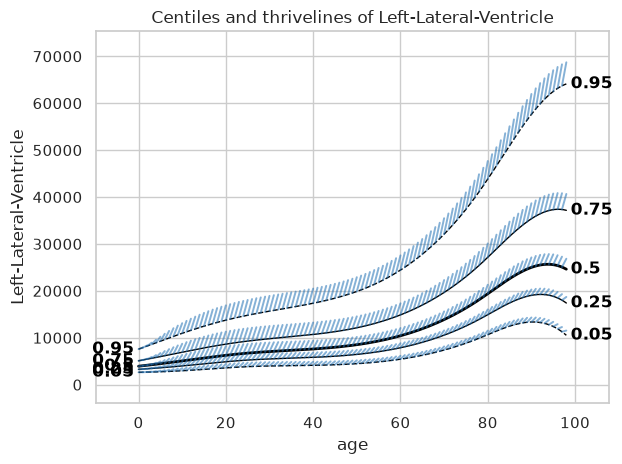

[ok]   i=0  Left-Lateral-Ventricle


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 01:46:42 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 01:46:42 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 01:46:42 - Computing centiles for Left-Inf-Lat-Vent.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


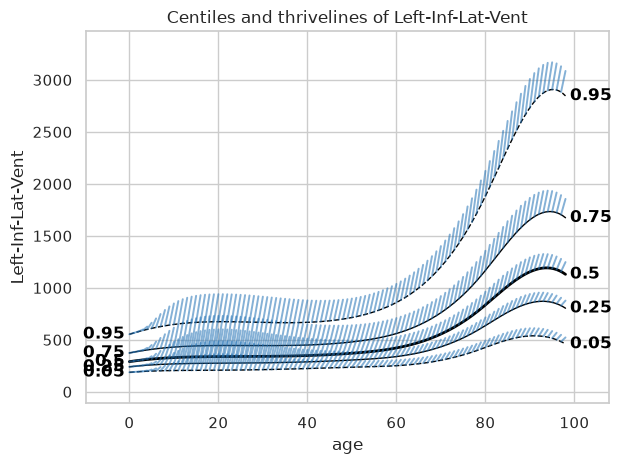

[ok]   i=1  Left-Inf-Lat-Vent


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 01:47:21 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 01:47:21 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 01:47:21 - Computing centiles for Left-Cerebellum-White-Matter.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


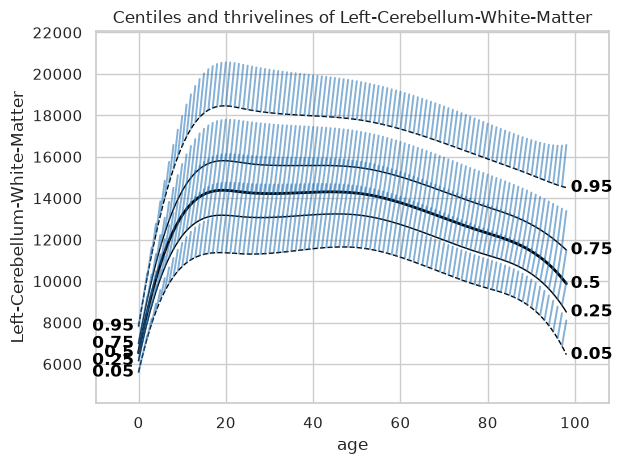

[ok]   i=2  Left-Cerebellum-White-Matter


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 01:48:02 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 01:48:02 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 01:48:02 - Computing centiles for Left-Cerebellum-Cortex.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


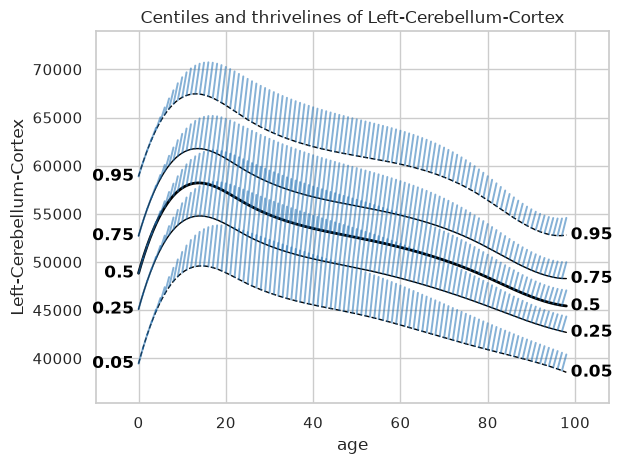

[ok]   i=3  Left-Cerebellum-Cortex


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 01:48:41 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 01:48:41 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 01:48:41 - Computing centiles for Left-Thalamus.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


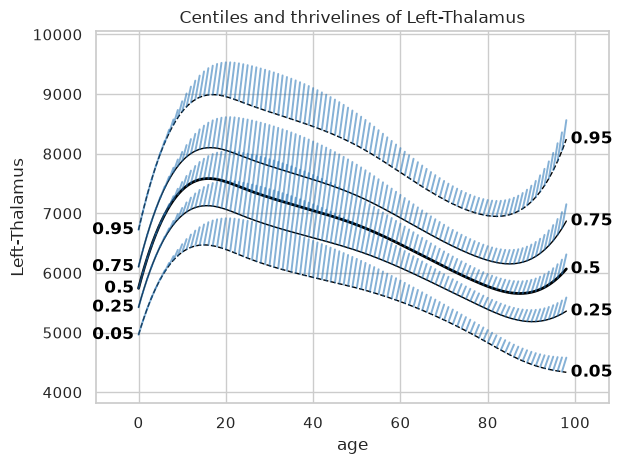

[ok]   i=4  Left-Thalamus


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 01:49:20 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 01:49:20 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 01:49:20 - Computing centiles for Left-Caudate.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


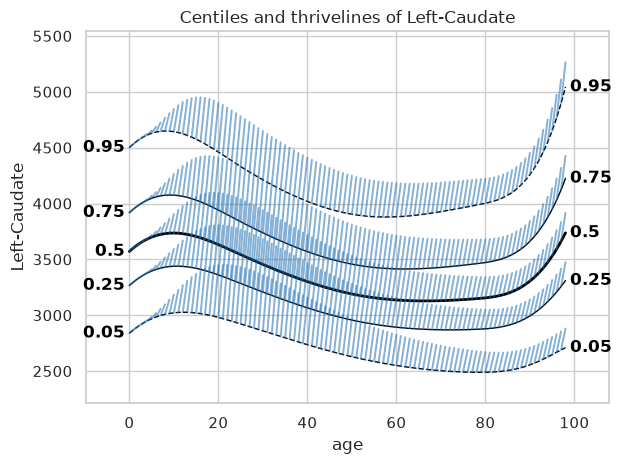

[ok]   i=5  Left-Caudate


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 01:50:00 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 01:50:00 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 01:50:00 - Computing centiles for Left-Putamen.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


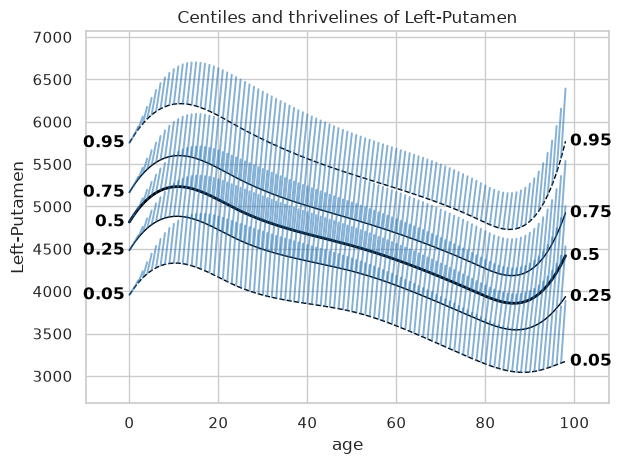

[ok]   i=6  Left-Putamen


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 01:50:39 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 01:50:39 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 01:50:39 - Computing centiles for Left-Pallidum.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


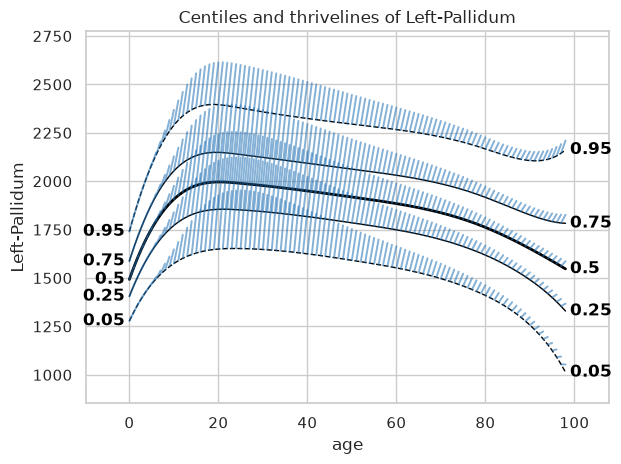

[ok]   i=7  Left-Pallidum


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 01:51:19 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 01:51:19 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 01:51:19 - Computing centiles for 3rd-Ventricle.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


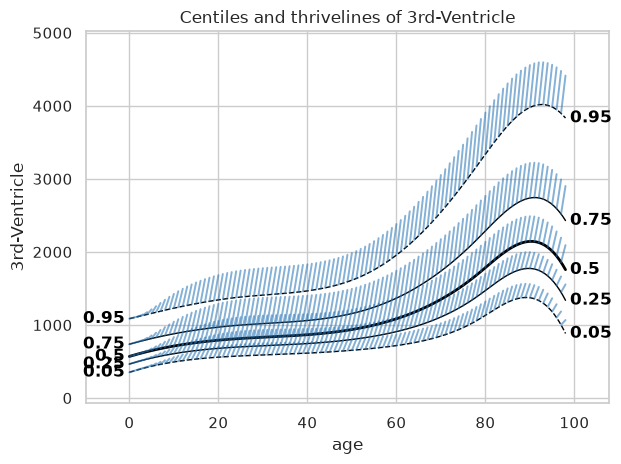

[ok]   i=8  3rd-Ventricle
[FAIL] i=9  4th-Ventricle: Process: 3014427 - 2026-09-12 01:51:41 - HBR model is not fitted


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 01:52:01 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 01:52:01 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 01:52:01 - Computing centiles for Brain-Stem.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


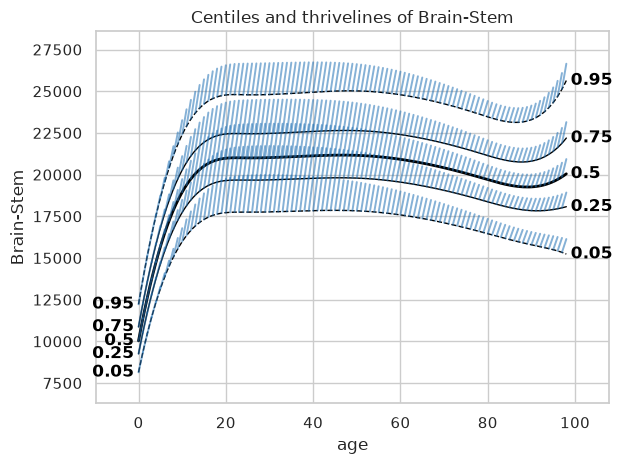

[ok]   i=10  Brain-Stem


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 01:52:41 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 01:52:41 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 01:52:41 - Computing centiles for Left-Hippocampus.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


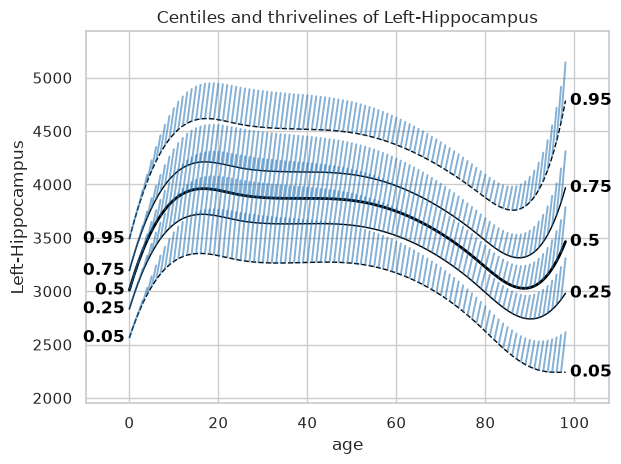

[ok]   i=11  Left-Hippocampus


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 01:53:21 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 01:53:21 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 01:53:21 - Computing centiles for Left-Amygdala.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


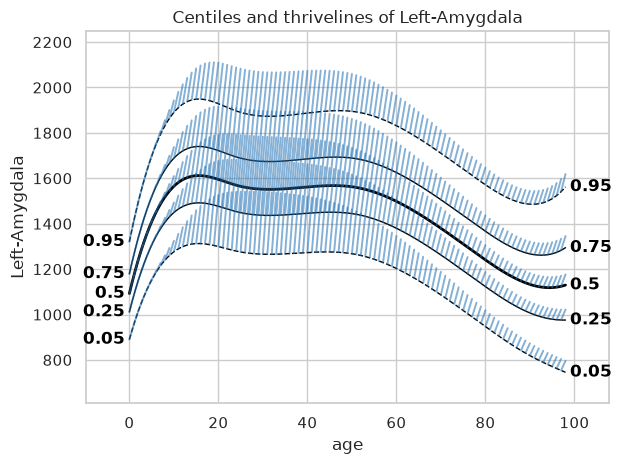

[ok]   i=12  Left-Amygdala


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 01:54:01 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 01:54:01 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 01:54:01 - Computing centiles for CSF.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


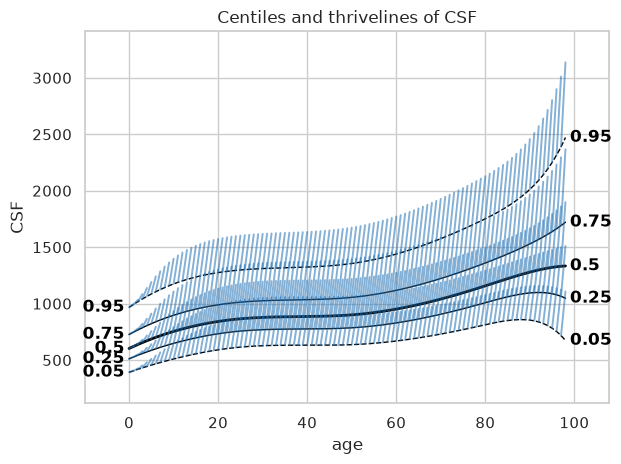

[ok]   i=13  CSF


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 01:54:41 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 01:54:41 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 01:54:41 - Computing centiles for Left-Accumbens-area.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


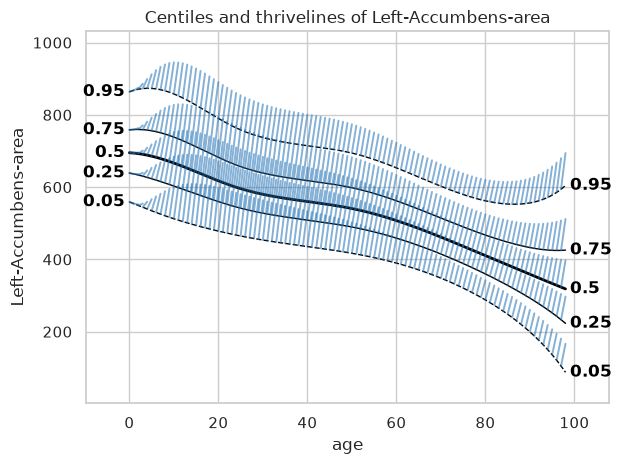

[ok]   i=14  Left-Accumbens-area


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 01:55:20 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 01:55:20 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 01:55:20 - Computing centiles for Left-VentralDC.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


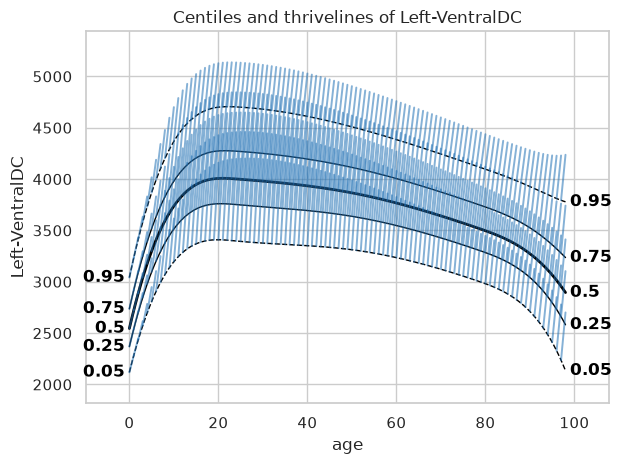

[ok]   i=15  Left-VentralDC


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 01:56:00 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 01:56:00 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 01:56:00 - Computing centiles for Left-vessel.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


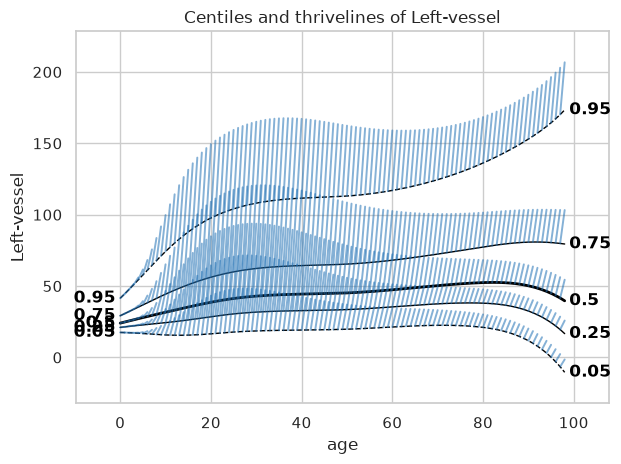

[ok]   i=16  Left-vessel


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 01:56:42 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 01:56:42 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 01:56:42 - Computing centiles for Left-choroid-plexus.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


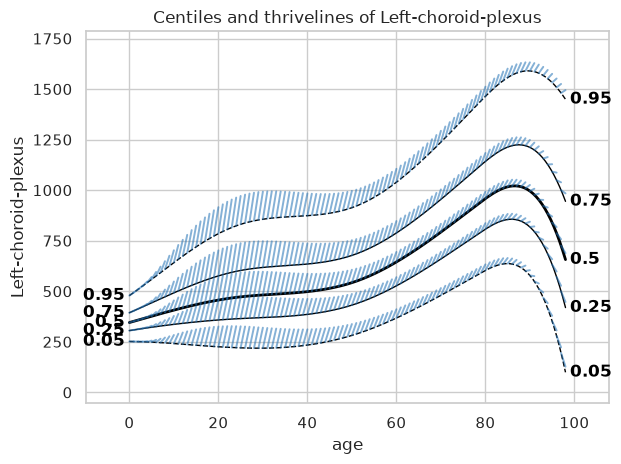

[ok]   i=17  Left-choroid-plexus


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 01:57:22 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 01:57:22 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 01:57:22 - Computing centiles for Right-Lateral-Ventricle.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


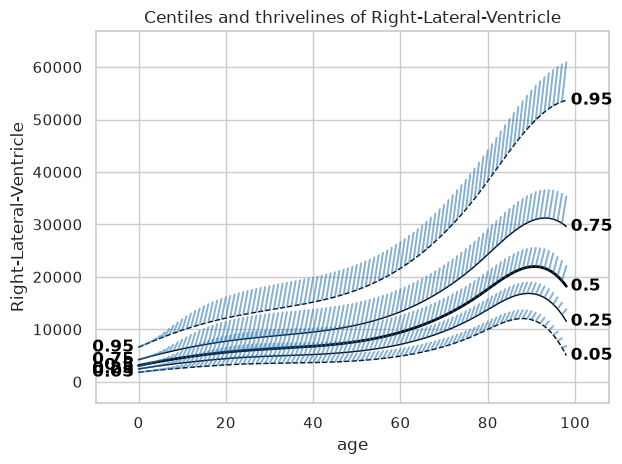

[ok]   i=18  Right-Lateral-Ventricle


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 01:58:02 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 01:58:02 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 01:58:02 - Computing centiles for Right-Inf-Lat-Vent.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


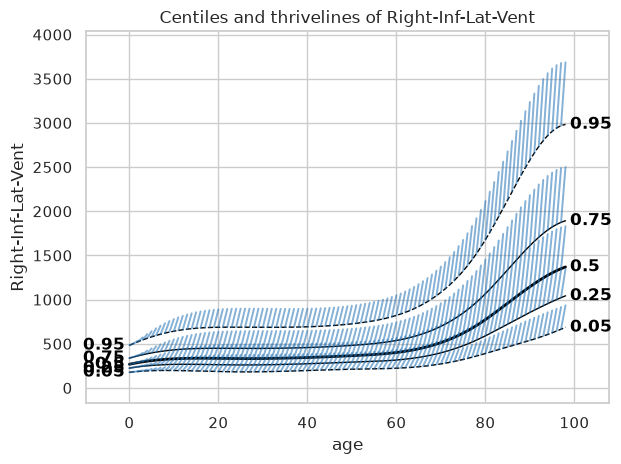

[ok]   i=19  Right-Inf-Lat-Vent


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 01:58:41 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 01:58:41 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 01:58:41 - Computing centiles for Right-Cerebellum-White-Matter.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


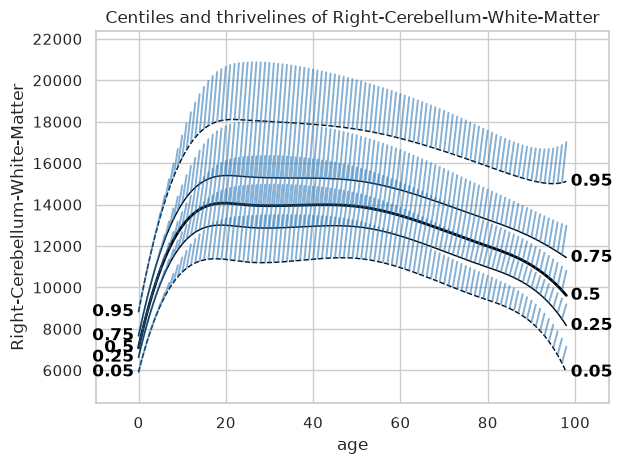

[ok]   i=20  Right-Cerebellum-White-Matter


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 01:59:22 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 01:59:22 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 01:59:22 - Computing centiles for Right-Cerebellum-Cortex.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


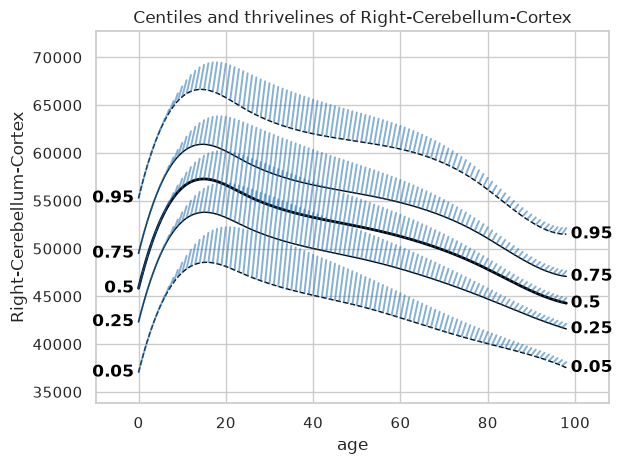

[ok]   i=21  Right-Cerebellum-Cortex


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 02:00:00 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 02:00:00 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 02:00:00 - Computing centiles for Right-Thalamus.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


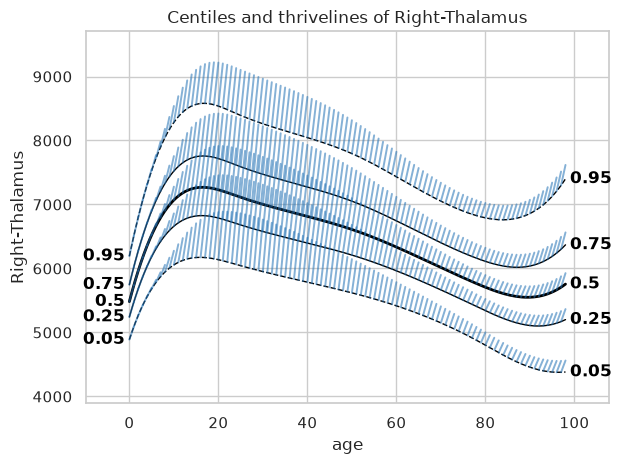

[ok]   i=22  Right-Thalamus


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 02:00:40 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 02:00:40 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 02:00:40 - Computing centiles for Right-Caudate.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


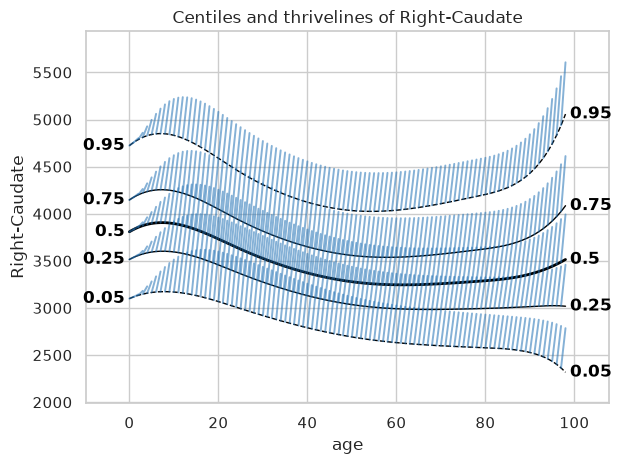

[ok]   i=23  Right-Caudate


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 02:01:21 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 02:01:21 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 02:01:21 - Computing centiles for Right-Putamen.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


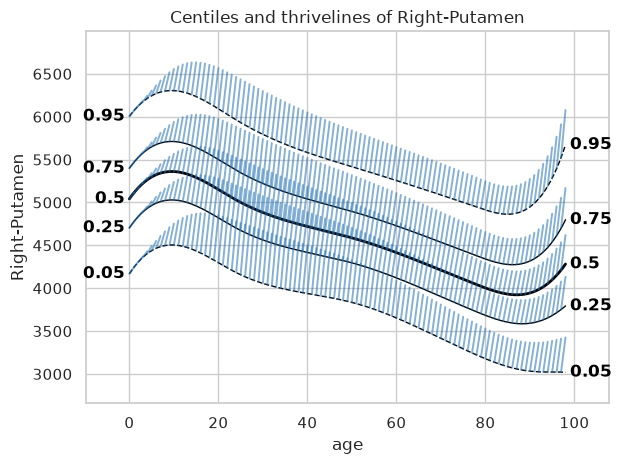

[ok]   i=24  Right-Putamen


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 02:02:00 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 02:02:00 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 02:02:00 - Computing centiles for Right-Pallidum.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


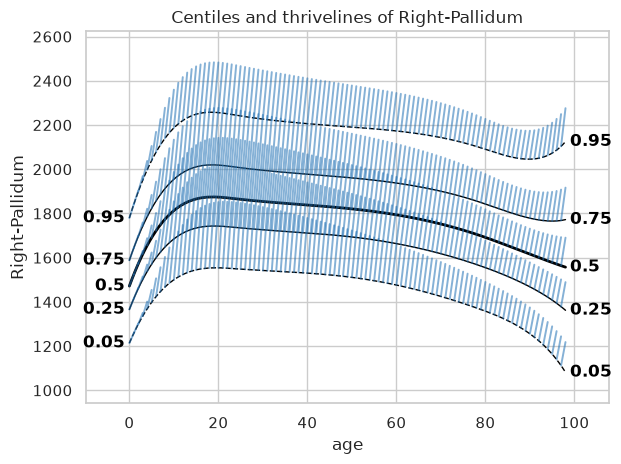

[ok]   i=25  Right-Pallidum


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 02:02:40 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 02:02:40 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 02:02:40 - Computing centiles for Right-Hippocampus.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


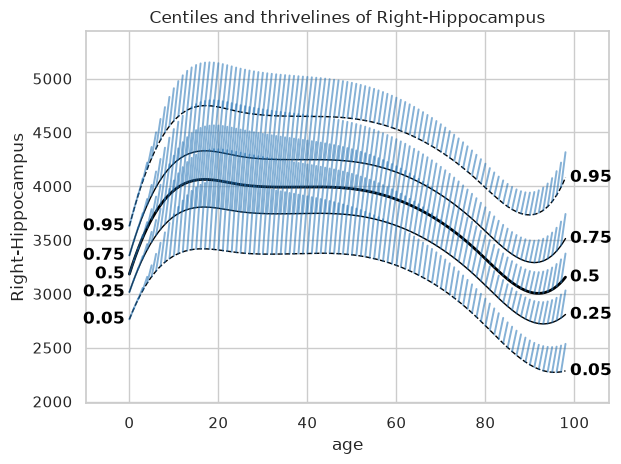

[ok]   i=26  Right-Hippocampus


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 02:03:21 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 02:03:21 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 02:03:21 - Computing centiles for Right-Amygdala.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


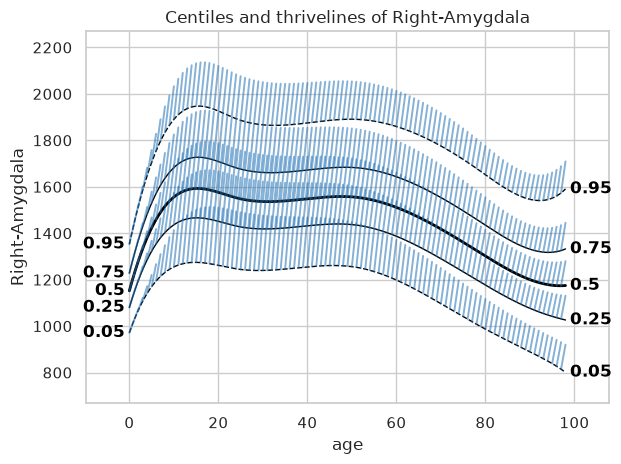

[ok]   i=27  Right-Amygdala


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 02:04:00 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 02:04:00 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 02:04:00 - Computing centiles for Right-Accumbens-area.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


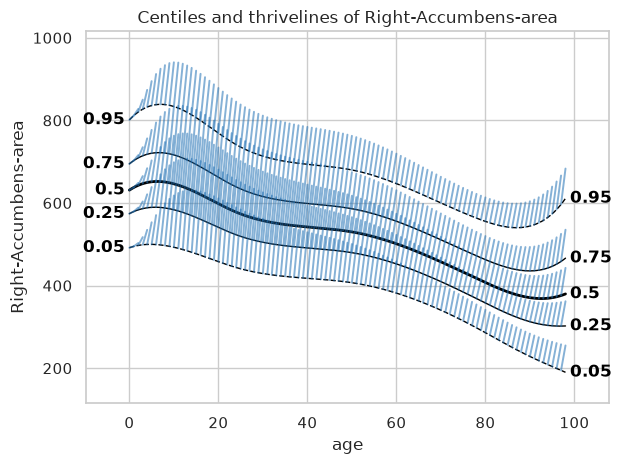

[ok]   i=28  Right-Accumbens-area


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 02:04:40 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 02:04:40 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 02:04:40 - Computing centiles for Right-VentralDC.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


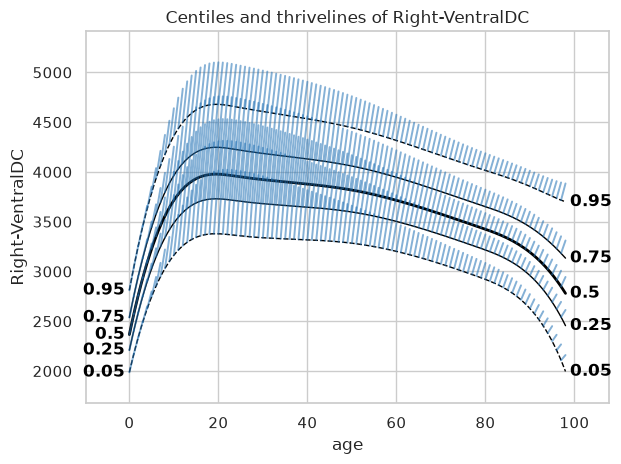

[ok]   i=29  Right-VentralDC


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 02:05:22 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 02:05:22 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 02:05:22 - Computing centiles for Right-vessel.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


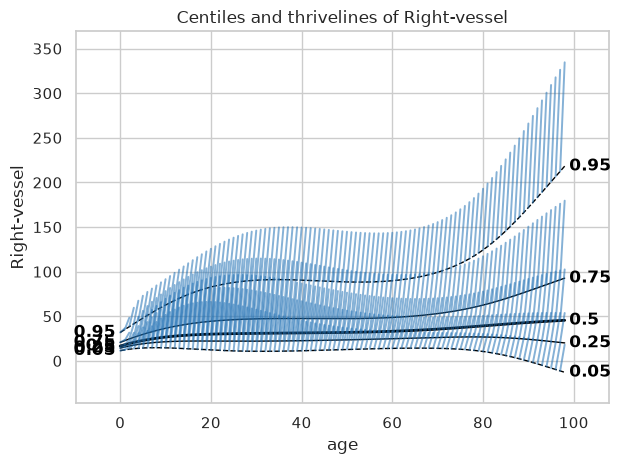

[ok]   i=30  Right-vessel


Sampling: []
Sampling: []


Process: 3014427 - 2026-09-12 02:06:02 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 3014427 - 2026-09-12 02:06:02 - Computing centiles for 1 response variables.
Process: 3014427 - 2026-09-12 02:06:02 - Computing centiles for Right-choroid-plexus.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


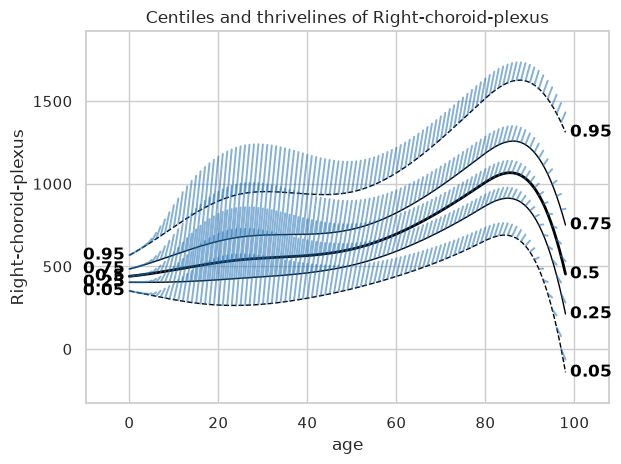

[ok]   i=31  Right-choroid-plexus
[FAIL] i=32  5th-Ventricle: Process: 3014427 - 2026-09-12 02:06:24 - HBR model is not fitted


In [7]:
from pathlib import Path

base = Path("/project_cephfs/3022017.06/projects/lifespan_hbr/johbay/Velocity/Velocity_models/SC_demented")

for i, response_vars in enumerate(features_to_model[:33]):
    try:
        # wildcard the batch number: match batch_<anything>_<response_var>
        matches = list(base.glob(f"batch_*_{response_vars}/Velocity/velocity_objects_new_Oct25.pkl"))
        if not matches:
            print(f"[MISSING] i={i}  {response_vars}: no matching batch folder")
            continue
        if len(matches) > 1:
            print(f"[WARN] i={i}  {response_vars}: {len(matches)} matches, using first")
        MATRIX_PATH = str(matches[0])

        corr = CorrelationMatrix.load(MATRIX_PATH)
        REGION = str(corr.matrix.coords["response_vars"].values[0])

        centiles = [0.05, 0.25, 0.5, 0.75, 0.95]

        thrivelines = ZGainScore(model, corr).get_thrivelines(
            z_anchors=stats.norm.ppf(centiles),
        )

        plot_thrivelines(
            model,
            thrivelines=thrivelines,
            centiles=centiles,
            covariate="age",
            response_vars=[REGION],
            save_dir='/project_cephfs/3022017.06/projects/lifespan_hbr/johbay/Velocity/CODE_new/revision/thriveline_plots/SC/UP'
        )
        print(f"[ok]   i={i}  {response_vars}")

    except Exception as e:
        print(f"[FAIL] i={i}  {response_vars}: {e}")
        continue